In [0]:
pip install uszipcode

Python interpreter will be restarted.
  Created wheel for atomicwrites: filename=atomicwrites-1.4.1-py2.py3-none-any.whl size=6958 sha256=65164d0a134a4182f27926187883d20a0d27f7adc41879f128e86386186e159a
  Stored in directory: /home/spark-cd028764-363d-4cb5-b26c-7d/.cache/pip/wheels/2a/b5/06/d2f34584f352e4af7d1d7ac1baf38b5d24142c8044cd024fd5
Successfully built atomicwrites
Python interpreter will be restarted.


In [0]:
pip install scikit-learn==1.2.2

Python interpreter will be restarted.
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.0.2
    Not uninstalling scikit-learn at /databricks/python3/lib/python3.9/site-packages, outside environment /local_disk0/.ephemeral_nfs/envs/pythonEnv-cd028764-363d-4cb5-b26c-7d5ec39ac125
    Can't uninstall 'scikit-learn'. No files were found to uninstall.
Python interpreter will be restarted.


In [0]:
from pyspark.sql import functions as F
import pandas as pd
import re
import numpy as np
import time
from uszipcode import SearchEngine
import seaborn as sns
import matplotlib.pyplot as plt
from pyspark.sql.types import FloatType,BooleanType,DateType, DoubleType
from uszipcode import SearchEngine, SimpleZipcode, ComprehensiveZipcode

from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.datasets import make_regression
from sklearn.ensemble import VotingRegressor
from sklearn.model_selection import train_test_split
from sklearn.model_selection import TimeSeriesSplit
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import SplineTransformer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import cross_validate
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import LearningCurveDisplay, ShuffleSplit


/local_disk0/.ephemeral_nfs/envs/pythonEnv-cd028764-363d-4cb5-b26c-7d5ec39ac125/lib/python3.9/site-packages/fuzzywuzzy/fuzz.py:11: UserWarning: Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning
  warnings.warn('Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning')


In [0]:
#set_config(transform_output="pandas")

In [0]:
df_train =  spark.sql("""
    SELECT * FROM dev_ensineme.sirius.treinamento_tri
    """)
df_test =  spark.sql("""
    SELECT * FROM dev_ensineme.sirius.test
    """)

#samples.nyctaxi.trips

In [0]:
#int(df_train.count()) - int(df_train.distinct().count())

In [0]:
df_train = df_train.distinct()
display(df_train)

key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
2012-12-29T20:26:00.000+0000,9.0,2012-12-29T20:26:00.000+0000,-73.974568,40.755237,-73.982355,40.77321,2
2009-07-18T00:03:00.000+0000,4.1,2009-07-18T00:03:00.000+0000,-73.98468,40.764245,-73.984097,40.761925,2
2015-01-10T12:57:53.000+0000,11.5,2015-01-10T12:57:53.000+0000,-73.97189331054688,40.765804290771484,-73.99393463134766,40.73270034790039,1
2014-11-25T00:27:03.000+0000,14.0,2014-11-25T00:27:03.000+0000,-73.988634,40.756732,-73.987621,40.72158,1
2013-05-22T23:40:18.000+0000,7.0,2013-05-22T23:40:18.000+0000,-73.980211,40.751043,-73.983669,40.765059,1
2010-09-20T21:11:12.000+0000,4.9,2010-09-20T21:11:12.000+0000,-73.990068,40.735341,-73.999346,40.727671,1
2010-03-21T01:37:00.000+0000,14.5,2010-03-21T01:37:00.000+0000,-73.972938,40.755058,-73.973372,40.755083,2
2011-03-06T18:23:00.000+0000,10.9,2011-03-06T18:23:00.000+0000,-73.946205,40.77242,-73.98764,40.738443,1
2010-04-23T09:01:00.000+0000,6.5,2010-04-23T09:01:00.000+0000,-73.972208,40.746567,-73.97153,40.753635,4
2015-04-19T11:55:28.000+0000,7.5,2015-04-19T11:55:28.000+0000,-73.93657684326172,40.82027053833008,-73.95230865478516,40.803138732910156,1


In [0]:
#df_train.count()

In [0]:
#existem linhas com informação de pickup time mas dropoff nulo
#display(df_train.where(F.col("dropoff_longitude").isNull()))

In [0]:
#existem linhas com fare_amount negativo ou zero; dentre os dados com fare_amount=0, existem informações incompletas de pickup/dropoff
#display(df_train.where((F.col("fare_amount") == 0) & (F.col("pickup_latitude") == 0)))

In [0]:
#display(df_train.where(((F.col("dropoff_longitude").isNull())) | (F.col("dropoff_latitude").isNull())))

In [0]:
#display(df_train.where(((F.col("dropoff_longitude") == 0) | (F.col("dropoff_latitude") == 0))))

In [0]:
#display(df_train.where(((F.col("passenger_count") >10))))

In [0]:
df_train = df_train.where((~(F.col("dropoff_longitude").isNull())) & (~(F.col("dropoff_latitude").isNull())))
df_train = df_train.where(~(F.col("fare_amount") < 0))
df_train = df_train.where((~(F.col("dropoff_longitude") == 0) & (~(F.col("dropoff_latitude") == 0))))
df_train = df_train.where((~(F.col("pickup_longitude") == 0) & (~(F.col("pickup_latitude") == 0))))
df_train = df_train.where(((F.col("pickup_latitude").between(40, 45))))
df_train = df_train.where(((F.col("pickup_longitude").between(-80, -70))))
df_train = df_train.where(((F.col("dropoff_latitude").between(40, 45))))
df_train = df_train.where(((F.col("dropoff_longitude").between(-80, -70))))
df_train = df_train.where(((F.col("passenger_count").between (1,6))))


In [0]:
display(df_train.where(((F.col("dropoff_longitude").isNull())) | (F.col("dropoff_latitude").isNull())))
display(df_train.where(((F.col("dropoff_longitude") == 0) | (F.col("dropoff_latitude") == 0))))
display(df_train.where((F.col("fare_amount") < 0)))
display(df_train.where((F.col("passenger_count") > 10)))
display(df_train.where(~(F.col("pickup_latitude").between(40, 45))))
display(df_train.where(~(F.col("pickup_longitude").between(-80, -70))))
display(df_train.where(~(F.col("dropoff_latitude").between(40, 45))))
display(df_train.where(~(F.col("dropoff_longitude").between(-80, -70))))

key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count


key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count


key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count


key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count


key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count


key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count


key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count


key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count


In [0]:
#display(df_train.where((F.col("fare_amount") == 0)))

In [0]:
#df_train.count()

In [0]:
display(df_train)

key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
2012-12-29T20:26:00.000+0000,9.0,2012-12-29T20:26:00.000+0000,-73.974568,40.755237,-73.982355,40.77321,2
2009-07-18T00:03:00.000+0000,4.1,2009-07-18T00:03:00.000+0000,-73.98468,40.764245,-73.984097,40.761925,2
2015-01-10T12:57:53.000+0000,11.5,2015-01-10T12:57:53.000+0000,-73.97189331054688,40.765804290771484,-73.99393463134766,40.73270034790039,1
2014-11-25T00:27:03.000+0000,14.0,2014-11-25T00:27:03.000+0000,-73.988634,40.756732,-73.987621,40.72158,1
2013-05-22T23:40:18.000+0000,7.0,2013-05-22T23:40:18.000+0000,-73.980211,40.751043,-73.983669,40.765059,1
2010-09-20T21:11:12.000+0000,4.9,2010-09-20T21:11:12.000+0000,-73.990068,40.735341,-73.999346,40.727671,1
2010-03-21T01:37:00.000+0000,14.5,2010-03-21T01:37:00.000+0000,-73.972938,40.755058,-73.973372,40.755083,2
2011-03-06T18:23:00.000+0000,10.9,2011-03-06T18:23:00.000+0000,-73.946205,40.77242,-73.98764,40.738443,1
2010-04-23T09:01:00.000+0000,6.5,2010-04-23T09:01:00.000+0000,-73.972208,40.746567,-73.97153,40.753635,4
2015-04-19T11:55:28.000+0000,7.5,2015-04-19T11:55:28.000+0000,-73.93657684326172,40.82027053833008,-73.95230865478516,40.803138732910156,1


In [0]:
df_train = df_train.withColumn("Year", F.split(df_train['pickup_datetime'], '-').getItem(0))
df_train = df_train.withColumn("Timestamp", F.to_timestamp("pickup_datetime", 'yyyy-MM-dd HH:mm:ss'))
df_train = df_train.withColumn('Hour', F.hour(df_train.Timestamp))
df_train = df_train.withColumn('fare_amount', F.col('fare_amount').cast(FloatType()))

df_test = df_test.withColumn("Year", F.split(df_test['pickup_datetime'], '-').getItem(0))
df_test = df_test.withColumn("Timestamp", F.to_timestamp("pickup_datetime", 'yyyy-MM-dd HH:mm:ss'))
df_test = df_test.withColumn('Hour', F.hour(df_test.Timestamp))




display(df_train)
display(df_test)

key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,Year,Timestamp,Hour
2012-12-29T20:26:00.000+0000,9.0,2012-12-29T20:26:00.000+0000,-73.974568,40.755237,-73.982355,40.77321,2,2012,2012-12-29T20:26:00.000+0000,20
2009-07-18T00:03:00.000+0000,4.1,2009-07-18T00:03:00.000+0000,-73.98468,40.764245,-73.984097,40.761925,2,2009,2009-07-18T00:03:00.000+0000,0
2015-01-10T12:57:53.000+0000,11.5,2015-01-10T12:57:53.000+0000,-73.97189331054688,40.765804290771484,-73.99393463134766,40.73270034790039,1,2015,2015-01-10T12:57:53.000+0000,12
2014-11-25T00:27:03.000+0000,14.0,2014-11-25T00:27:03.000+0000,-73.988634,40.756732,-73.987621,40.72158,1,2014,2014-11-25T00:27:03.000+0000,0
2013-05-22T23:40:18.000+0000,7.0,2013-05-22T23:40:18.000+0000,-73.980211,40.751043,-73.983669,40.765059,1,2013,2013-05-22T23:40:18.000+0000,23
2010-09-20T21:11:12.000+0000,4.9,2010-09-20T21:11:12.000+0000,-73.990068,40.735341,-73.999346,40.727671,1,2010,2010-09-20T21:11:12.000+0000,21
2010-03-21T01:37:00.000+0000,14.5,2010-03-21T01:37:00.000+0000,-73.972938,40.755058,-73.973372,40.755083,2,2010,2010-03-21T01:37:00.000+0000,1
2011-03-06T18:23:00.000+0000,10.9,2011-03-06T18:23:00.000+0000,-73.946205,40.77242,-73.98764,40.738443,1,2011,2011-03-06T18:23:00.000+0000,18
2010-04-23T09:01:00.000+0000,6.5,2010-04-23T09:01:00.000+0000,-73.972208,40.746567,-73.97153,40.753635,4,2010,2010-04-23T09:01:00.000+0000,9
2015-04-19T11:55:28.000+0000,7.5,2015-04-19T11:55:28.000+0000,-73.93657684326172,40.82027053833008,-73.95230865478516,40.803138732910156,1,2015,2015-04-19T11:55:28.000+0000,11


key,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,Year,Timestamp,Hour
2015-01-27T13:08:24.000+0000,2015-01-27T13:08:24.000+0000,-73.97332000732422,40.7638053894043,-73.98143005371094,40.74383544921875,1,2015,2015-01-27T13:08:24.000+0000,13
2015-01-27T13:08:24.000+0000,2015-01-27T13:08:24.000+0000,-73.98686218261719,40.719383239746094,-73.99888610839844,40.739200592041016,1,2015,2015-01-27T13:08:24.000+0000,13
2011-10-08T11:53:44.000+0000,2011-10-08T11:53:44.000+0000,-73.982524,40.75126,-73.979654,40.746139,1,2011,2011-10-08T11:53:44.000+0000,11
2012-12-01T21:12:12.000+0000,2012-12-01T21:12:12.000+0000,-73.98116,40.767807,-73.990448,40.751635,1,2012,2012-12-01T21:12:12.000+0000,21
2012-12-01T21:12:12.000+0000,2012-12-01T21:12:12.000+0000,-73.966046,40.789775,-73.988565,40.744427,1,2012,2012-12-01T21:12:12.000+0000,21
2012-12-01T21:12:12.000+0000,2012-12-01T21:12:12.000+0000,-73.960983,40.765547,-73.979177,40.740053,1,2012,2012-12-01T21:12:12.000+0000,21
2011-10-06T12:10:20.000+0000,2011-10-06T12:10:20.000+0000,-73.949013,40.773204,-73.959622,40.770893,1,2011,2011-10-06T12:10:20.000+0000,12
2011-10-06T12:10:20.000+0000,2011-10-06T12:10:20.000+0000,-73.777282,40.646636,-73.985083,40.759368,1,2011,2011-10-06T12:10:20.000+0000,12
2011-10-06T12:10:20.000+0000,2011-10-06T12:10:20.000+0000,-74.014099,40.709638,-73.995106,40.741365,1,2011,2011-10-06T12:10:20.000+0000,12
2014-02-18T15:22:20.000+0000,2014-02-18T15:22:20.000+0000,-73.969582,40.765519,-73.980686,40.770725,1,2014,2014-02-18T15:22:20.000+0000,15


In [0]:
years_sum = df_train.groupby("Year").agg(F.count("fare_amount").alias("Number of trips"), \
                                         F.sum('fare_amount').alias("Total value"))
years_sum = years_sum.withColumn("Price per travel", years_sum["Total value"]/years_sum["Number of trips"])

hour_sum = df_train.groupby("Hour").agg(F.count("fare_amount").alias("Number of trips"), \
                                         F.sum('fare_amount').alias("Total value"))
hour_sum = hour_sum.withColumn("Price per travel", hour_sum["Total value"]/hour_sum["Number of trips"])

In [0]:
# display(years_sum)
# display(hour_sum)

In [0]:
pdf = df_train.sample(withReplacement = False, fraction = 0.0005, seed = 10).toPandas()
df_test = df_test.toPandas()

In [0]:
def extract_dateinfo(df, date_col, drop=True, time=False, 
                     start_ref = pd.datetime(1900, 1, 1),
                     extra_attr = False):
    fld = df[date_col]
  
    # Prefix for new columns
    pre = re.sub('[Dd]ate', '', date_col)
    pre = re.sub('[Tt]ime', '', pre)
    
    # Basic attributes
    attr = ['Dayofweek']
    
         
    # Iterate through each attribute
    for n in attr: 
        df[pre + n] = getattr(fld.dt, n.lower())
        
    if drop: 
        df = df.drop(date_col, axis=1)
        
    return df

<command-3148914678920770>:2: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  start_ref = pd.datetime(1900, 1, 1),


In [0]:
df_train = extract_dateinfo(pdf, 'pickup_datetime', drop = False, 
                         time = True, start_ref = '2009-01-01T03:54:20.000+0000')

In [0]:
# df_test = extract_dateinfo(df_test, 'pickup_datetime', drop = False, 
#                          time = True, start_ref = '2009-01-01T03:54:20.000+0000')

In [0]:
df_train

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,Year,Timestamp,Hour,pickup_Dayofweek
0,2014-12-31 22:04:00,6.5,2014-12-31 22:04:00,-73.976000,40.749117,-73.992355,40.742837,1,2014,2014-12-31 22:04:00,22,2
1,2010-10-09 13:20:00,6.9,2010-10-09 13:20:00,-73.988672,40.731150,-74.003275,40.744138,1,2010,2010-10-09 13:20:00,13,5
2,2010-09-15 23:00:12,22.9,2010-09-15 23:00:12,-73.994187,40.751288,-73.988302,40.769497,2,2010,2010-09-15 23:00:12,23,2
3,2009-04-25 19:17:00,4.1,2009-04-25 19:17:00,-73.980032,40.734743,-73.975868,40.743907,1,2009,2009-04-25 19:17:00,19,5
4,2013-06-03 10:39:29,4.0,2013-06-03 10:39:29,-73.981279,40.744578,-73.985550,40.738562,1,2013,2013-06-03 10:39:29,10,0
...,...,...,...,...,...,...,...,...,...,...,...,...
27172,2010-02-03 10:35:00,6.1,2010-02-03 10:35:00,-73.991796,40.754779,-73.980795,40.756777,1,2010,2010-02-03 10:35:00,10,2
27173,2013-09-30 23:28:00,13.5,2013-09-30 23:28:00,-73.989875,40.757290,-73.946652,40.797472,2,2013,2013-09-30 23:28:00,23,0
27174,2011-03-14 01:42:18,10.5,2011-03-14 01:42:18,-73.988088,40.759868,-73.953185,40.802140,1,2011,2011-03-14 01:42:18,1,0
27175,2014-03-06 23:48:00,4.5,2014-03-06 23:48:00,-73.984020,40.759962,-73.991600,40.750147,1,2014,2014-03-06 23:48:00,23,3


In [0]:
df_test

,key,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,Year,Timestamp,Hour
0,2015-01-27 13:08:24,2015-01-27 13:08:24,-73.973320,40.763805,-73.981430,40.743835,1,2015,2015-01-27 13:08:24,13
1,2015-01-27 13:08:24,2015-01-27 13:08:24,-73.986862,40.719383,-73.998886,40.739201,1,2015,2015-01-27 13:08:24,13
2,2011-10-08 11:53:44,2011-10-08 11:53:44,-73.982524,40.751260,-73.979654,40.746139,1,2011,2011-10-08 11:53:44,11
3,2012-12-01 21:12:12,2012-12-01 21:12:12,-73.981160,40.767807,-73.990448,40.751635,1,2012,2012-12-01 21:12:12,21
4,2012-12-01 21:12:12,2012-12-01 21:12:12,-73.966046,40.789775,-73.988565,40.744427,1,2012,2012-12-01 21:12:12,21
...,...,...,...,...,...,...,...,...,...,...
9909,2015-05-10 12:37:51,2015-05-10 12:37:51,-73.968124,40.796997,-73.955643,40.780388,6,2015,2015-05-10 12:37:51,12
9910,2015-01-12 17:05:51,2015-01-12 17:05:51,-73.945511,40.803600,-73.960213,40.776371,6,2015,2015-01-12 17:05:51,17
9911,2015-04-19 20:44:15,2015-04-19 20:44:15,-73.991600,40.726608,-73.789742,40.647011,6,2015,2015-04-19 20:44:15,20
9912,2015-01-31 01:05:19,2015-01-31 01:05:19,-73.985573,40.735432,-73.939178,40.801731,6,2015,2015-01-31 01:05:19,1


In [0]:
search = SearchEngine()

Download /home/spark-cd028764-363d-4cb5-b26c-7d/.uszipcode/simple_db.sqlite from https://github.com/MacHu-GWU/uszipcode-project/releases/download/1.0.1.db/simple_db.sqlite ...
  1.00 MB downloaded ...
  2.00 MB downloaded ...
  3.00 MB downloaded ...
  4.00 MB downloaded ...
  5.00 MB downloaded ...
  6.00 MB downloaded ...
  7.00 MB downloaded ...
  8.00 MB downloaded ...
  9.00 MB downloaded ...
  10.00 MB downloaded ...
  11.00 MB downloaded ...
  Complete!


In [0]:
# pdf = df_train.sample(withReplacement = False, fraction = 0.000001, seed = 11).toPandas()


# for idx in pdf.index:
#     pdf['zip_pickup']= search.by_coordinates(pdf['pickup_latitude'][idx], pdf['pickup_longitude'][idx], radius = 5, returns=1)[0].zipcode
#     pdf['zip_dropoff'] = search.by_coordinates(
#                     pdf['dropoff_latitude'][idx], pdf['dropoff_longitude'][idx], 
#                     returns=1, radius = 5)[0].zipcode

In [0]:
def get_zipcode(lat, lng):
    result = search.by_coordinates(lat, lng, radius=10, returns=1)
    #zipcode = result[0].zipcode
    return result[0].zipcode

def get_housevalue(lat, lng):
    result = search.by_coordinates(lat, lng, radius=10, returns=1)
    #zipcode = result[0].zipcode
    return result[0].median_household_income


In [0]:
result = search.by_coordinates(40.771800 , -73.982995, radius=1, returns=1)
result

#get_zipcode(40.771800 , -73.982995)

Out[29]: [SimpleZipcode(zipcode='10019', zipcode_type='STANDARD', major_city='New York', post_office_city='New York, NY', common_city_list=['New York'], county='New York County', state='NY', lat=40.77, lng=-73.99, timezone='America/New_York', radius_in_miles=0.9090909090909091, area_code_list='212,917,347,646,718,914', population=42870, population_density=63042.0, land_area_in_sqmi=0.68, water_area_in_sqmi=0.0, housing_units=31404, occupied_housing_units=25905, median_home_value=808600, median_household_income=84424, bounds_west=-74.003477, bounds_east=-73.973015, bounds_north=40.773446, bounds_south=40.758645)]

In [0]:
df_train['pickup_zipcode'] = df_train.apply( lambda x: get_zipcode(x["pickup_latitude"], x["pickup_longitude"]), axis=1)
df_train['dropoff_zipcode'] = df_train.apply(lambda x: get_zipcode(x['dropoff_latitude'], x['dropoff_longitude']), axis=1)
#df_train['pickup_housevalue'] = df_train.apply( lambda x: get_housevalue(x["dropoff_latitude"], x["dropoff_longitude"]), axis=1)


In [0]:
# df_test['pickup_zipcode'] = df_test.apply( lambda x: get_zipcode(x["pickup_latitude"], x["pickup_longitude"]), axis=1)
# df_test['dropoff_zipcode'] = df_test.apply(lambda x: get_zipcode(x['dropoff_latitude'], x['dropoff_longitude']), axis=1)
#df_test['pickup_housevalue'] = df_test.apply( lambda x: get_housevalue(x["pickup_latitude"], x["pickup_longitude"]), axis=1)

In [0]:
df_train

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,Year,Timestamp,Hour,pickup_Dayofweek,pickup_zipcode,dropoff_zipcode
0,2014-12-31 22:04:00,6.5,2014-12-31 22:04:00,-73.976000,40.749117,-73.992355,40.742837,1,2014,2014-12-31 22:04:00,22,2,10016,10011
1,2010-10-09 13:20:00,6.9,2010-10-09 13:20:00,-73.988672,40.731150,-74.003275,40.744138,1,2010,2010-10-09 13:20:00,13,5,10003,10011
2,2010-09-15 23:00:12,22.9,2010-09-15 23:00:12,-73.994187,40.751288,-73.988302,40.769497,2,2010,2010-09-15 23:00:12,23,2,10098,10019
3,2009-04-25 19:17:00,4.1,2009-04-25 19:17:00,-73.980032,40.734743,-73.975868,40.743907,1,2009,2009-04-25 19:17:00,19,5,10009,10010
4,2013-06-03 10:39:29,4.0,2013-06-03 10:39:29,-73.981279,40.744578,-73.985550,40.738562,1,2013,2013-06-03 10:39:29,10,0,10010,10010
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27172,2010-02-03 10:35:00,6.1,2010-02-03 10:35:00,-73.991796,40.754779,-73.980795,40.756777,1,2010,2010-02-03 10:35:00,10,2,10098,10020
27173,2013-09-30 23:28:00,13.5,2013-09-30 23:28:00,-73.989875,40.757290,-73.946652,40.797472,2,2013,2013-09-30 23:28:00,23,0,10018,10026
27174,2011-03-14 01:42:18,10.5,2011-03-14 01:42:18,-73.988088,40.759868,-73.953185,40.802140,1,2011,2011-03-14 01:42:18,1,0,10018,10026
27175,2014-03-06 23:48:00,4.5,2014-03-06 23:48:00,-73.984020,40.759962,-73.991600,40.750147,1,2014,2014-03-06 23:48:00,23,3,10020,10098


In [0]:
df_test

,key,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,Year,Timestamp,Hour
0,2015-01-27 13:08:24,2015-01-27 13:08:24,-73.973320,40.763805,-73.981430,40.743835,1,2015,2015-01-27 13:08:24,13
1,2015-01-27 13:08:24,2015-01-27 13:08:24,-73.986862,40.719383,-73.998886,40.739201,1,2015,2015-01-27 13:08:24,13
2,2011-10-08 11:53:44,2011-10-08 11:53:44,-73.982524,40.751260,-73.979654,40.746139,1,2011,2011-10-08 11:53:44,11
3,2012-12-01 21:12:12,2012-12-01 21:12:12,-73.981160,40.767807,-73.990448,40.751635,1,2012,2012-12-01 21:12:12,21
4,2012-12-01 21:12:12,2012-12-01 21:12:12,-73.966046,40.789775,-73.988565,40.744427,1,2012,2012-12-01 21:12:12,21
...,...,...,...,...,...,...,...,...,...,...
9909,2015-05-10 12:37:51,2015-05-10 12:37:51,-73.968124,40.796997,-73.955643,40.780388,6,2015,2015-05-10 12:37:51,12
9910,2015-01-12 17:05:51,2015-01-12 17:05:51,-73.945511,40.803600,-73.960213,40.776371,6,2015,2015-01-12 17:05:51,17
9911,2015-04-19 20:44:15,2015-04-19 20:44:15,-73.991600,40.726608,-73.789742,40.647011,6,2015,2015-04-19 20:44:15,20
9912,2015-01-31 01:05:19,2015-01-31 01:05:19,-73.985573,40.735432,-73.939178,40.801731,6,2015,2015-01-31 01:05:19,1


In [0]:
df_train.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,Hour,pickup_Dayofweek
count,27177.000000,27177.000000,27177.000000,27177.000000,27177.000000,27177.000000,27177.000000,27177.000000
mean,11.263391,-73.975569,40.751228,-73.974221,40.751960,1.690584,13.473121,3.056003
std,9.636950,0.043050,0.030934,0.043546,0.034547,1.301269,6.527378,1.948131
min,2.500000,-76.663201,40.190564,-76.663201,40.190564,1.000000,0.000000,0.000000
25%,6.000000,-73.992316,40.736738,-73.991490,40.736213,1.000000,9.000000,1.000000
50%,8.500000,-73.982092,40.753383,-73.980537,40.754187,1.000000,14.000000,3.000000
75%,12.500000,-73.968367,40.767633,-73.965079,40.768701,2.000000,19.000000,5.000000
max,255.500000,-72.557537,42.394027,-72.551960,42.417717,6.000000,23.000000,6.000000


In [0]:
df_train.corr()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,Hour,pickup_Dayofweek
fare_amount,1.000000,0.327888,-0.172318,0.280248,-0.139061,0.017496,-0.025274,0.004412
pickup_longitude,0.327888,1.000000,0.227516,0.539669,0.208723,-0.001554,0.009145,-0.012071
pickup_latitude,-0.172318,0.227516,1.000000,0.227175,0.520894,-0.004882,0.027448,-0.024512
dropoff_longitude,0.280248,0.539669,0.227175,1.000000,0.291797,0.001287,-0.039515,0.000985
dropoff_latitude,-0.139061,0.208723,0.520894,0.291797,1.000000,-0.006387,0.014426,-0.008999
passenger_count,0.017496,-0.001554,-0.004882,0.001287,-0.006387,1.000000,0.024466,0.036229
Hour,-0.025274,0.009145,0.027448,-0.039515,0.014426,0.024466,1.000000,-0.096356
pickup_Dayofweek,0.004412,-0.012071,-0.024512,0.000985,-0.008999,0.036229,-0.096356,1.000000


In [0]:
df_test.describe()


,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,Hour
count,9914.000000,9914.000000,9914.000000,9914.000000,9914.000000,9914.000000
mean,-73.974722,40.751041,-73.973657,40.751743,1.671273,13.467420
std,0.042774,0.033541,0.039072,0.035435,1.278747,6.868584
min,-74.252193,40.573143,-74.263242,40.568973,1.000000,0.000000
25%,-73.992501,40.736125,-73.991247,40.735254,1.000000,8.000000
50%,-73.982326,40.753051,-73.980015,40.754065,1.000000,15.000000
75%,-73.968013,40.767113,-73.964059,40.768757,2.000000,19.000000
max,-72.986532,41.709555,-72.990963,41.696683,6.000000,23.000000


In [0]:
# ldf_test_pandas = df_test.toPandas()
# df_test = extract_dateinfo(df_test_pandas, 'pickup_datetime', drop = False, 
#                          time = True, start_ref = '2009-01-01T03:54:20.000+0000')

In [0]:
def sphere_dist(pickup_lat, pickup_lon, dropoff_lat, dropoff_lon):
    """
    Return distance along great radius between pickup and dropoff coordinates.
    """
    #Define earth radius (km)
    R_earth = 6371
    #Convert degrees to radians
    pickup_lat, pickup_lon, dropoff_lat, dropoff_lon = map(np.radians,
                                                             [pickup_lat, pickup_lon, 
                                                              dropoff_lat, dropoff_lon])
    #Compute distances along lat, lon dimensions
    dlat = dropoff_lat - pickup_lat
    dlon = dropoff_lon - pickup_lon
    
    #Compute haversine distance
    a = np.sin(dlat/2.0)**2 + np.cos(pickup_lat) * np.cos(dropoff_lat) * np.sin(dlon/2.0)**2
    
    return 2 * R_earth * np.arcsin(np.sqrt(a))

In [0]:
df_train['distance'] = sphere_dist(df_train['pickup_latitude'], df_train['pickup_longitude'], 
                                   df_train['dropoff_latitude'] , df_train['dropoff_longitude'])

In [0]:
df_test['distance'] = sphere_dist(df_test['pickup_latitude'], df_test['pickup_longitude'], 
                                   df_test['dropoff_latitude'] , df_test['dropoff_longitude'])

In [0]:
df_train.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,Hour,pickup_Dayofweek,distance
count,27177.000000,27177.000000,27177.000000,27177.000000,27177.000000,27177.000000,27177.000000,27177.000000,27177.000000
mean,11.263391,-73.975569,40.751228,-73.974221,40.751960,1.690584,13.473121,3.056003,3.303117
std,9.636950,0.043050,0.030934,0.043546,0.034547,1.301269,6.527378,1.948131,3.765604
min,2.500000,-76.663201,40.190564,-76.663201,40.190564,1.000000,0.000000,0.000000,0.000000
25%,6.000000,-73.992316,40.736738,-73.991490,40.736213,1.000000,9.000000,1.000000,1.243033
50%,8.500000,-73.982092,40.753383,-73.980537,40.754187,1.000000,14.000000,3.000000,2.126722
75%,12.500000,-73.968367,40.767633,-73.965079,40.768701,2.000000,19.000000,5.000000,3.876160
max,255.500000,-72.557537,42.394027,-72.551960,42.417717,6.000000,23.000000,6.000000,99.933684


In [0]:
df_train.corr()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,Hour,pickup_Dayofweek,distance
fare_amount,1.000000,0.327888,-0.172318,0.280248,-0.139061,0.017496,-0.025274,0.004412,0.817564
pickup_longitude,0.327888,1.000000,0.227516,0.539669,0.208723,-0.001554,0.009145,-0.012071,0.355699
pickup_latitude,-0.172318,0.227516,1.000000,0.227175,0.520894,-0.004882,0.027448,-0.024512,-0.132012
dropoff_longitude,0.280248,0.539669,0.227175,1.000000,0.291797,0.001287,-0.039515,0.000985,0.304979
dropoff_latitude,-0.139061,0.208723,0.520894,0.291797,1.000000,-0.006387,0.014426,-0.008999,-0.083421
passenger_count,0.017496,-0.001554,-0.004882,0.001287,-0.006387,1.000000,0.024466,0.036229,0.011593
Hour,-0.025274,0.009145,0.027448,-0.039515,0.014426,0.024466,1.000000,-0.096356,-0.033595
pickup_Dayofweek,0.004412,-0.012071,-0.024512,0.000985,-0.008999,0.036229,-0.096356,1.000000,0.015395
distance,0.817564,0.355699,-0.132012,0.304979,-0.083421,0.011593,-0.033595,0.015395,1.000000


In [0]:
df_test.corr()

,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,Hour,distance
pickup_longitude,1.000000,0.284509,0.437949,0.246595,0.006398,0.018839,0.472293
pickup_latitude,0.284509,1.000000,0.274527,0.520171,-0.025120,0.020985,-0.072641
dropoff_longitude,0.437949,0.274527,1.000000,0.344918,0.012389,-0.053896,0.266218
dropoff_latitude,0.246595,0.520171,0.344918,1.000000,0.005606,0.019565,-0.117695
passenger_count,0.006398,-0.025120,0.012389,0.005606,1.000000,0.033931,0.027367
Hour,0.018839,0.020985,-0.053896,0.019565,0.033931,1.000000,-0.019906
distance,0.472293,-0.072641,0.266218,-0.117695,0.027367,-0.019906,1.000000


Out[44]: (0.0, 80.0)

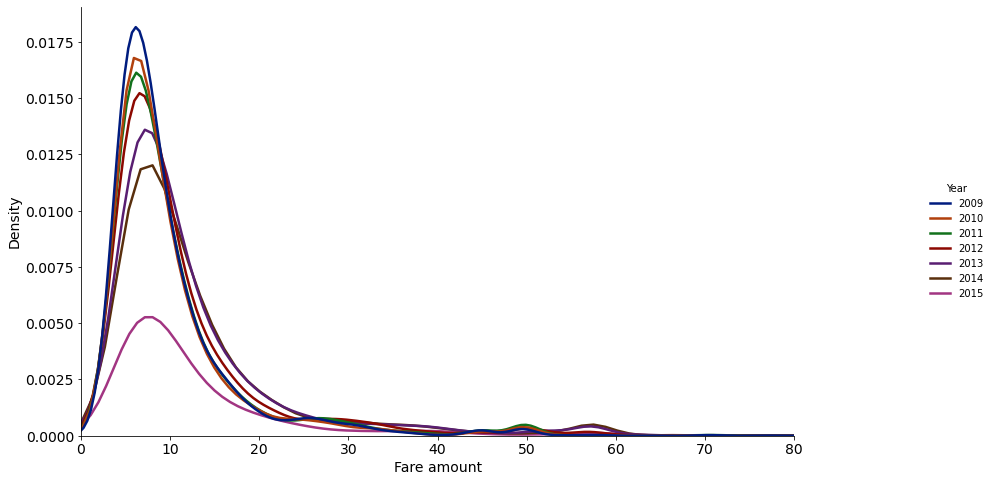

In [0]:
#plt.figure(figsize=(15, 10))
df_train = df_train.sort_values(by="Year")
g = sns.displot(df_train, x="fare_amount", hue="Year", kind='kde', palette="dark", lw=2.5)
g.fig.set_size_inches(15,7)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel('Fare amount', fontsize=14)
plt.ylabel('Density', fontsize=14)
plt.xlim([0, 80])



Out[45]: (0.0, 100.0)

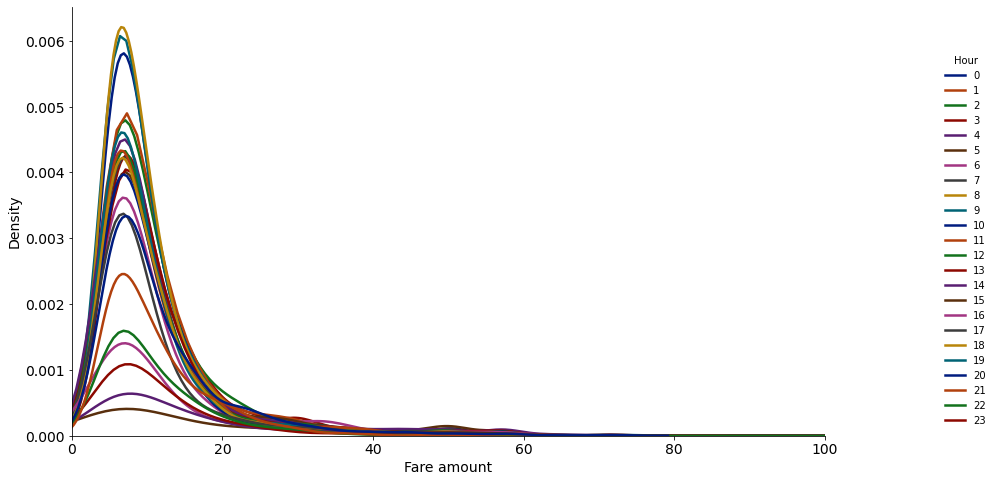

In [0]:
h = sns.displot(df_train, x="fare_amount", hue="Hour", kind='kde', palette="dark", lw=2.5)
h.fig.set_size_inches(15,7)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel('Fare amount', fontsize=14)
plt.ylabel('Density', fontsize=14)
plt.xlim([0, 100])

Out[46]: (0.0, 100.0)

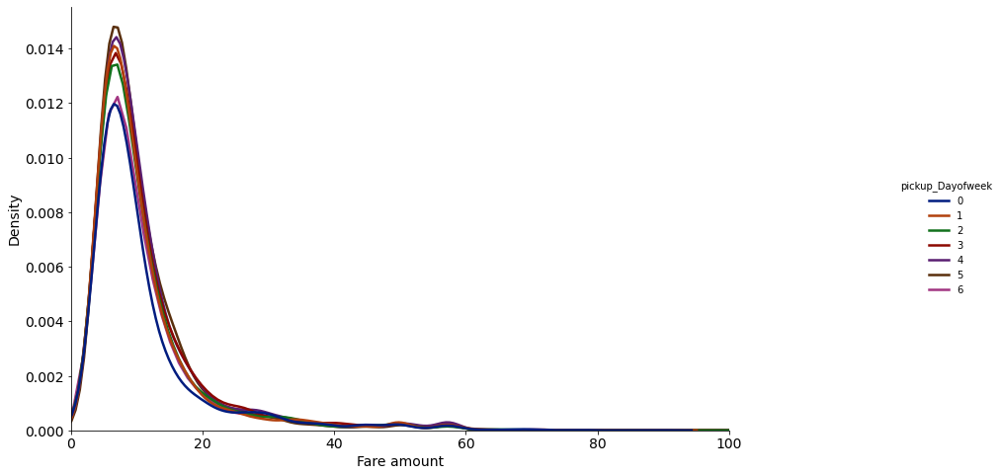

In [0]:
i = sns.displot(df_train, x="fare_amount", hue="pickup_Dayofweek", kind='kde', palette="dark", lw=2.5)
i.fig.set_size_inches(15,7)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel('Fare amount', fontsize=14)
plt.ylabel('Density', fontsize=14)
plt.xlim([0, 100])

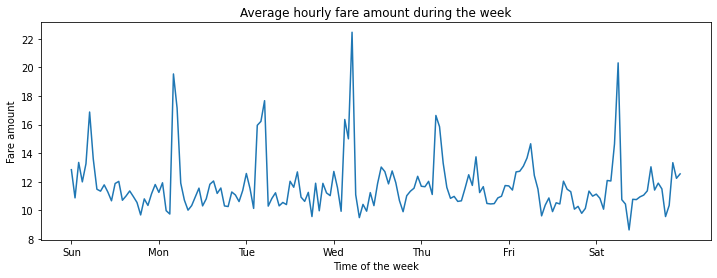

In [0]:
fig, ax = plt.subplots(figsize=(12, 4))
average_week = df_train.groupby(["pickup_Dayofweek", "Hour"])["fare_amount"].mean()
average_week.plot(ax=ax)
_ = ax.set(
    title="Average hourly fare amount during the week",
    xticks=[i * 24 for i in range(7)],
    xticklabels=["Sun", "Mon", "Tue", "Wed", "Thu", "Fri", "Sat"],
    xlabel="Time of the week",
    ylabel="Fare amount",
)


In [0]:
std_scale = StandardScaler()

#Treino Raw

In [0]:
y = df_train["fare_amount"]
features = ["pickup_latitude", "pickup_longitude", "dropoff_latitude", "dropoff_longitude", "passenger_count"]
X_raw = df_train[features]
X_train_raw, X_test_raw, y_train_raw, y_test_raw = train_test_split(X_raw, y, random_state=42)


In [0]:
model = RandomForestRegressor(max_depth=4, random_state=0)
model.fit(X_train_raw, y_train_raw)

RandomForestRegressor(max_depth=4, random_state=0) In a Jupyter environment, please rerun this cell to show the HTML representation or trust the notebook. On GitHub, the HTML representation is unable to render, please try loading this page with nbviewer.org. RandomForestRegressor RandomForestRegressor(max_depth=4, random_state=0)

In [0]:
r2_score1 = model.score(X_test_raw, y_test_raw)
mae = mean_absolute_error(y_test_raw, model.predict(X_test_raw))
print("The mean absolute error (MAE) on test set: {:.4f}".format(mae))
print("The R2 score on test set: {:.4f}".format(r2_score1))

The mean absolute error (MAE) on test set: 4.0619
The R2 score on test set: 0.5926


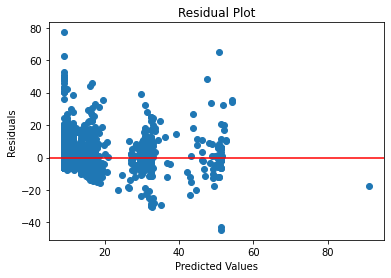

In [0]:
y_pred = model.predict(X_test_raw)
residuals = y_test_raw - y_pred
plt.scatter(y_pred, residuals)
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.axhline(y=0, color='r', linestyle='-')
plt.title('Residual Plot')
plt.show()


In [0]:
# param_grid = {
#     'bootstrap': [True],
#     'max_depth': [5, 10, 30, 40, 50],
#     'max_features': [2, 3],
#     'min_samples_leaf': [2, 3, 4, 5],
#     'min_samples_split': [8, 10, 12],
#     'n_estimators': [100, 200, 300, 400]}

# grid_search = GridSearchCV(estimator=RandomForestRegressor(random_state=0), param_grid=param_grid,
#                            cv=3, return_train_score=True, n_jobs=-1)

# grid_search.fit(X_train_raw, y_train_raw)

In [0]:
#pd.DataFrame(grid_search.cv_results_)

In [0]:
y_train_raw

Out[55]: 25251     6.1
16855    16.1
4347      4.5
16736    24.0
3127      6.5
         ... 
1557      9.5
26787     4.1
23941    10.1
5303      4.9
13207     7.0
Name: fare_amount, Length: 20382, dtype: float32

In [0]:
# grid_search.best_params_

In [0]:
# best_rf = grid_search.best_estimator_
# **grid_search.best_params_ 
#unfold that dict

In [0]:
# best_rf = RandomForestRegressor(bootstrap= True, max_depth = 50, max_features= 3, min_samples_leaf= 2, min_samples_split= 8, n_estimators= 400, random_state=0)
# best_rf.fit(X_train_raw, y_train_raw)
# r2_score_best = best_rf.score(X_test_raw, y_test_raw)
# mae = mean_absolute_error(y_test_raw, best_rf.predict(X_test_raw))
# print("The mean absolute error (MAE) on test set: {:.4f}".format(mae))
# print("The R2 score on test set: {:.4f}".format(r2_score_best))

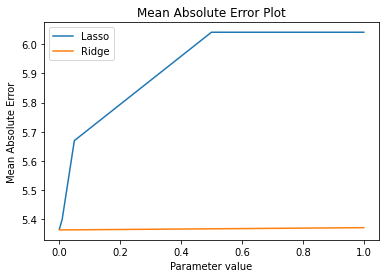

In [0]:
alphas = [0.001, 0.01, 0.05, 0.5, 1]

mae_values = []
mae_values2 = []
#mae_values3 = []
for alpha in alphas:
    model = Lasso(alpha=alpha)
    model.fit(X_train_raw, y_train_raw)
    y_pred = model.predict(X_test_raw)
    mae = mean_absolute_error(y_test_raw, y_pred)
    mae_values.append(mae)
    model2 = Ridge(alpha=alpha)
    model2.fit(X_train_raw, y_train_raw)
    y_pred2 = model2.predict(X_test_raw)
    mae2 = mean_absolute_error(y_test_raw, y_pred2)
    mae_values2.append(mae2)

plt.plot(alphas, mae_values, label="Lasso")
plt.plot(alphas, mae_values2, label = "Ridge")
#plt.axhline(y=2.3516, color='r', linestyle='-', label = "Best fit  - Random Forest")
plt.xlabel("Parameter value")
plt.ylabel("Mean Absolute Error")
plt.title("Mean Absolute Error Plot")
#plt.ylim(2,7)
plt.legend()
plt.show()

In [0]:
#normalizar as features

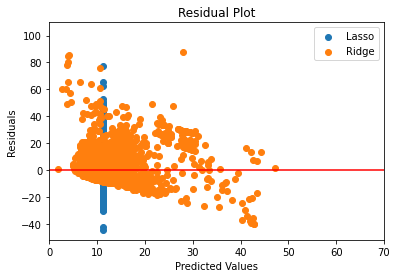

In [0]:
alpha = 0.3
model1 = Lasso(alpha=alpha)
model1.fit(X_train_raw, y_train_raw)
y_pred = model1.predict(X_test_raw)
model2 = Ridge(alpha=alpha)
model2.fit(X_train_raw, y_train_raw)
y_pred2 = model2.predict(X_test_raw)
residuals1 = y_test_raw - y_pred
residuals2 = y_test_raw - y_pred2
plt.scatter(y_pred, residuals, label = "Lasso")
plt.scatter(y_pred2, residuals2, label = "Ridge")
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.axhline(y=0, color='r', linestyle='-')
plt.xlim(0,70)
plt.title('Residual Plot')
plt.legend()
plt.show()

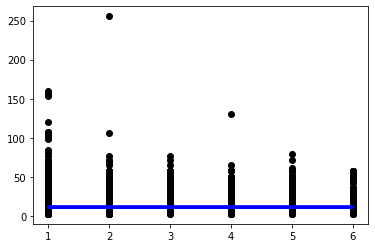

In [0]:
plt.scatter(X_train_raw["passenger_count"], y_train_raw, color="black")
plt.plot(X_test_raw["passenger_count"], y_pred, color="blue", linewidth=3)
plt.show()
#tem q tirar 0 passageiros


#Treino pós Feature Engineering

In [0]:
df_train.set_index('key', inplace=True)
df_train.sort_index(inplace=True)

In [0]:
y = df_train["fare_amount"]
features = ["Hour", "pickup_Dayofweek", "distance", "Year", "passenger_count", "pickup_zipcode", "dropoff_zipcode"]
X = df_train[features]
categorical_columns = [
    "Year",
    "pickup_zipcode",
    "dropoff_zipcode"]
categorical_columns_2 = [
    "Year",
    "pickup_zipcode",
    "dropoff_zipcode",
    "pickup_Dayofweek",
    'Hour']
#X_std = std_scale.fit_transform(X[features].iloc[:,range(2,7)].values)

In [0]:
tss = TimeSeriesSplit(n_splits = 5)
for train_index, test_index in tss.split(X):
    X_train, X_test = X.iloc[train_index, :], X.iloc[test_index,:]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]


In [0]:
X

,Hour,pickup_Dayofweek,distance,Year,passenger_count,pickup_zipcode,dropoff_zipcode
key,,,,,,,
2009-01-01 00:48:24,0,3,0.958956,2009,2,10018,10019
2009-01-01 03:23:08,3,3,1.666174,2009,1,10001,10018
2009-01-01 05:02:54,5,3,3.503178,2009,1,10003,11222
2009-01-01 13:48:05,13,3,3.874007,2009,1,10011,10280
2009-01-01 16:11:15,16,3,0.883482,2009,2,10011,10011
...,...,...,...,...,...,...,...
2015-06-30 20:14:48,20,1,1.574391,2015,1,10012,10003
2015-06-30 21:59:45,21,1,3.153912,2015,1,10013,10001
2015-06-30 22:33:55,22,1,4.135238,2015,1,10009,10021


In [0]:
X_train

,Hour,pickup_Dayofweek,distance,Year,passenger_count,pickup_zipcode,dropoff_zipcode
key,,,,,,,
2009-01-01 00:48:24,0,3,0.958956,2009,2,10018,10019
2009-01-01 03:23:08,3,3,1.666174,2009,1,10001,10018
2009-01-01 05:02:54,5,3,3.503178,2009,1,10003,11222
2009-01-01 13:48:05,13,3,3.874007,2009,1,10011,10280
2009-01-01 16:11:15,16,3,0.883482,2009,2,10011,10011
...,...,...,...,...,...,...,...
2014-04-26 10:20:40,10,5,1.166558,2014,1,10018,10018
2014-04-26 11:19:00,11,5,0.658189,2014,1,10003,10003
2014-04-26 11:32:00,11,5,8.140528,2014,1,10023,10005


In [0]:
X_test

,Hour,pickup_Dayofweek,distance,Year,passenger_count,pickup_zipcode,dropoff_zipcode
key,,,,,,,
2014-04-26 15:01:45,15,5,7.002772,2014,2,10075,10013
2014-04-26 18:37:00,18,5,3.199767,2014,1,10011,10013
2014-04-26 20:25:53,20,5,2.189651,2014,1,10011,10013
2014-04-26 20:42:00,20,5,0.706923,2014,1,10010,10010
2014-04-26 20:47:02,20,5,4.164446,2014,1,10021,10010
...,...,...,...,...,...,...,...
2015-06-30 20:14:48,20,1,1.574391,2015,1,10012,10003
2015-06-30 21:59:45,21,1,3.153912,2015,1,10013,10001
2015-06-30 22:33:55,22,1,4.135238,2015,1,10009,10021


In [0]:
all_splits = list(tss.split(X, y))

In [0]:
X_train

,Hour,pickup_Dayofweek,distance,Year,passenger_count,pickup_zipcode,dropoff_zipcode
key,,,,,,,
2009-01-01 00:48:24,0,3,0.958956,2009,2,10018,10019
2009-01-01 03:23:08,3,3,1.666174,2009,1,10001,10018
2009-01-01 05:02:54,5,3,3.503178,2009,1,10003,11222
2009-01-01 13:48:05,13,3,3.874007,2009,1,10011,10280
2009-01-01 16:11:15,16,3,0.883482,2009,2,10011,10011
...,...,...,...,...,...,...,...
2014-04-26 10:20:40,10,5,1.166558,2014,1,10018,10018
2014-04-26 11:19:00,11,5,0.658189,2014,1,10003,10003
2014-04-26 11:32:00,11,5,8.140528,2014,1,10023,10005


In [0]:
X_test

,Hour,pickup_Dayofweek,distance,Year,passenger_count,pickup_zipcode,dropoff_zipcode
key,,,,,,,
2014-04-26 15:01:45,15,5,7.002772,2014,2,10075,10013
2014-04-26 18:37:00,18,5,3.199767,2014,1,10011,10013
2014-04-26 20:25:53,20,5,2.189651,2014,1,10011,10013
2014-04-26 20:42:00,20,5,0.706923,2014,1,10010,10010
2014-04-26 20:47:02,20,5,4.164446,2014,1,10021,10010
...,...,...,...,...,...,...,...
2015-06-30 20:14:48,20,1,1.574391,2015,1,10012,10003
2015-06-30 21:59:45,21,1,3.153912,2015,1,10013,10001
2015-06-30 22:33:55,22,1,4.135238,2015,1,10009,10021


In [0]:
one_hot_encoder = OneHotEncoder(handle_unknown="ignore", sparse=False)

In [0]:
def periodic_spline_transformer(period, n_splines=None, degree=3):
    if n_splines is None:
        n_splines = period
    n_knots = n_splines + 1  # periodic and include_bias is True
    return SplineTransformer(
        degree=degree,
        n_knots=n_knots,
        knots=np.linspace(0, period, n_knots).reshape(n_knots, 1),
        extrapolation="periodic",
        include_bias=True,
    )

cyclic_spline_transformer = ColumnTransformer(
    transformers=[
        ("cyclic_weekday", periodic_spline_transformer(7, n_splines=3), ["pickup_Dayofweek"]),
        ("cyclic_hour", periodic_spline_transformer(24, n_splines=12), ["Hour"]),
        ("categorical", one_hot_encoder, categorical_columns)
    ],
    remainder=std_scale,
)


In [0]:
encoder_transformer = ColumnTransformer(
    transformers=[
        ("categorical", one_hot_encoder, categorical_columns_2)
    ],
    remainder=std_scale,
)

In [0]:
pd.DataFrame(cyclic_spline_transformer.fit_transform(df_train[features]))

/local_disk0/.ephemeral_nfs/envs/pythonEnv-cd028764-363d-4cb5-b26c-7d5ec39ac125/lib/python3.9/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


,0,1,2,3,4,5,6,7,8,9,...,390,391,392,393,394,395,396,397,398,399
0,0.338678,0.064626,0.596696,0.166667,0.666667,0.166667,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.622531,0.237785
1,0.338678,0.064626,0.596696,0.000000,0.020833,0.479167,0.479167,0.020833,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.434717,-0.530710
2,0.338678,0.064626,0.596696,0.000000,0.000000,0.020833,0.479167,0.479167,0.020833,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.053130,-0.530710
3,0.338678,0.064626,0.596696,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.020833,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.151609,-0.530710
4,0.338678,0.064626,0.596696,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.642574,0.237785
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27172,0.044218,0.522352,0.433431,0.166667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.459092,-0.530710
27173,0.044218,0.522352,0.433431,0.479167,0.020833,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.039624,-0.530710
27174,0.044218,0.522352,0.433431,0.666667,0.166667,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.220984,-0.530710
27175,0.044218,0.522352,0.433431,0.479167,0.479167,0.020833,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.165377,-0.530710


In [0]:
model_ridge_ciclic= Ridge(alpha=0.5)
model_ridge_ciclic_pipe = Pipeline(steps=[("turn_cyclic", cyclic_spline_transformer), ("ridge_regression", model_ridge_ciclic)])

In [0]:
model_ridge_ciclic_pipe.fit(X_train, y_train)
#model1_pipe.predict(X_test)

/local_disk0/.ephemeral_nfs/envs/pythonEnv-cd028764-363d-4cb5-b26c-7d5ec39ac125/lib/python3.9/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Pipeline(steps=[('turn_cyclic',
 ColumnTransformer(remainder=StandardScaler(),
 transformers=[('cyclic_weekday',
 SplineTransformer(extrapolation='periodic',
 knots=array([[0. ],
 [2.33333333],
 [4.66666667],
 [7. ]]),
 n_knots=4),
 ['pickup_Dayofweek']),
 ('cyclic_hour',
 SplineTransformer(extrapolation='periodic',
 knots=array([[ 0.],
 [ 2.],
 [ 4.],
 [ 6.],
 [ 8.],
 [10.],
 [12.],
 [14.],
 [16.],
 [18.],
 [20.],
 [22.],
 [24.]]),
 n_knots=13),
 ['Hour']),
 ('categorical',
 OneHotEncoder(handle_unknown='ignore',
 sparse=False),
 ['Year', 'pickup_zipcode',
 'dropoff_zipcode'])])),
 ('ridge_regression', Ridge(alpha=0.5))]) In a Jupyter environment, please rerun this cell to show the HTML representation or trust the notebook. On GitHub, the HTML representation is unable to render, please try loading this page with nbviewer.org. Pipeline Pipeline(steps=[('turn_cyclic',
 ColumnTransformer(remainder=StandardScaler(),
 transformers=[('cyclic_weekday',
 SplineTransformer(extrapolation='periodic',
 knots=array([[0. ],
 [2.33333333],
 [4.66666667],
 [7. ]]),
 n_knots=4),
 ['pickup_Dayofweek']),
 ('cyclic_hour',
 SplineTransformer(extrapolation='periodic',
 knots=array([[ 0.],
 [ 2.],
 [ 4.],
 [ 6.],
 [ 8.],
 [10.],
 [12.],
 [14.],
 [16.],
 [18.],
 [20.],
 [22.],
 [24.]]),
 n_knots=13),
 ['Hour']),
 ('categorical',
 OneHotEncoder(handle_unknown='ignore',
 sparse=False),
 ['Year', 'pickup_zipcode',
 'dropoff_zipcode'])])),
 ('ridge_regression', Ridge(alpha=0.5))]) turn_cyclic: ColumnTransformer ColumnTransformer(remainder=StandardScaler(),
 transformers=[('cyclic_weekday',
 SplineTransformer(extrapolation='periodic',
 knots=array([[0. ],
 [2.33333333],
 [4.66666667],
 [7. ]]),
 n_knots=4),
 ['pickup_Dayofweek']),
 ('cyclic_hour',
 SplineTransformer(extrapolation='periodic',
 knots=array([[ 0.],
 [ 2.],
 [ 4.],
 [ 6.],
 [ 8.],
 [10.],
 [12.],
 [14.],
 [16.],
 [18.],
 [20.],
 [22.],
 [24.]]),
 n_knots=13),
 ['Hour']),
 ('categorical',
 OneHotEncoder(handle_unknown='ignore',
 sparse=False),
 ['Year', 'pickup_zipcode',
 'dropoff_zipcode'])]) cyclic_weekday ['pickup_Dayofweek'] SplineTransformer SplineTransformer(extrapolation='periodic',
 knots=array([[0. ],
 [2.33333333],
 [4.66666667],
 [7. ]]),
 n_knots=4) cyclic_hour ['Hour'] SplineTransformer SplineTransformer(extrapolation='periodic',
 knots=array([[ 0.],
 [ 2.],
 [ 4.],
 [ 6.],
 [ 8.],
 [10.],
 [12.],
 [14.],
 [16.],
 [18.],
 [20.],
 [22.],
 [24.]]),
 n_knots=13) categorical ['Year', 'pickup_zipcode', 'dropoff_zipcode'] OneHotEncoder OneHotEncoder(handle_unknown='ignore', sparse=False) remainder ['distance', 'passenger_count'] StandardScaler StandardScaler() Ridge Ridge(alpha=0.5)

In [0]:
model_ridge_ciclic_pipe.score(X_train, y_train)


Out[78]: 0.7931408546821419

In [0]:
model_ridge_ciclic_pipe.score(X_test, y_test)

Out[79]: 0.7895365807137315

In [0]:
model_ridge= Ridge(alpha=0.5)
model_ridge_pipe = Pipeline(steps=[('scaler', StandardScaler()), ("ridge_regression", model_ridge)])

In [0]:
model_ridge_pipe.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
 ('ridge_regression', Ridge(alpha=0.5))]) In a Jupyter environment, please rerun this cell to show the HTML representation or trust the notebook. On GitHub, the HTML representation is unable to render, please try loading this page with nbviewer.org. Pipeline Pipeline(steps=[('scaler', StandardScaler()),
 ('ridge_regression', Ridge(alpha=0.5))]) StandardScaler StandardScaler() Ridge Ridge(alpha=0.5)

In [0]:
model_ridge_pipe.score(X_train, y_train)

Out[82]: 0.6657038290127737

In [0]:
model_ridge_pipe.score(X_test, y_test)

Out[83]: 0.7569333388075689

In [0]:
model2_pipe.steps[1][1].feature_importances_
model2_pipe.named_steps['turn_cyclic'].transformers_[1][1]\
   .named_steps['categorical'].get_feature_names(categorical_columns)

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-1340173426829421>:1
----> 1 model2_pipe.steps[1][1].feature_importances_
      2 model2_pipe.named_steps['turn_cyclic'].transformers_[1][1]\
      3    .named_steps['categorical'].get_feature_names(categorical_columns)

NameError: name 'model2_pipe' is not defined

In [0]:
model1= LinearRegression()
model1_pipe = Pipeline(steps=[('scaler', StandardScaler()), ("linear_regression", model1)])

In [0]:
model1_pipe.fit(X_train, y_train)
model1_pipe.predict(X_test)

Out[86]: array([19.24928557, 11.77101269,  9.85379949, ..., 14.17950434,
       13.82608876, 10.15495646])

In [0]:
model1_pipe.score(X_train, y_train)

Out[87]: 0.6657038293293113

In [0]:
model1_pipe.score(X_test, y_test)
#quantas vezes é melhor q a média

Out[88]: 0.7569394226662003

In [0]:
model1_pipe.named_steps["linear_regression"].coef_, X_train.columns
#distancia, ano e pickup_zipcode sao os parametros com maior peso

Out[89]: (array([-0.00885229, -0.06848585,  7.09929203,  0.78925911,  0.0827277 ,
         1.1667632 , -0.02094848]),
 Index(['Hour', 'pickup_Dayofweek', 'distance', 'Year', 'passenger_count',
        'pickup_zipcode', 'dropoff_zipcode'],
       dtype='object'))

/local_disk0/.ephemeral_nfs/envs/pythonEnv-cd028764-363d-4cb5-b26c-7d5ec39ac125/lib/python3.9/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/local_disk0/.ephemeral_nfs/envs/pythonEnv-cd028764-363d-4cb5-b26c-7d5ec39ac125/lib/python3.9/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/local_disk0/.ephemeral_nfs/envs/pythonEnv-cd028764-363d-4cb5-b26c-7d5ec39ac125/lib/python3.9/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  w

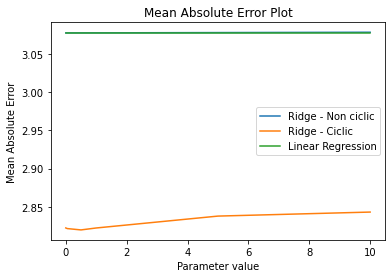

In [0]:
alphas = [0.001, 0.01, 0.05, 0.5, 1, 5, 10]


mae_values = []
mae_values2 = []
mae_values3 = []

for alpha in alphas:
    model_ridge_ciclic= Ridge(alpha=alpha)
    model_ridge_ciclic_pipe = Pipeline(steps=[("turn_cyclic", cyclic_spline_transformer), ("ridge_regression", model_ridge_ciclic)])
    model_ridge_ciclic_pipe.fit(X_train, y_train)
    y_pred = model_ridge_ciclic_pipe.predict(X_test)
    mae = mean_absolute_error(y_test, y_pred)
    mae_values.append(mae)
    model_ridge= Ridge(alpha=alpha)
    model_ridge_pipe = Pipeline(steps=[('scaler', StandardScaler()), ("ridge_regression", model_ridge)])
    model_ridge_pipe.fit(X_train, y_train)
    y_pred2 = model_ridge_pipe.predict(X_test)
    mae2 = mean_absolute_error(y_test, y_pred2)
    mae_values2.append(mae2)
    model1= LinearRegression()
    model1_pipe = Pipeline(steps=[('scaler', StandardScaler()), ("linear_regression", model1)])
    model1_pipe.fit(X_train, y_train)
    y_pred3 = model1_pipe.predict(X_test)
    mae3 = mean_absolute_error(y_test, y_pred3)
    mae_values3.append(mae3)


plt.plot(alphas, mae_values2, label = "Ridge - Non ciclic")
plt.plot(alphas, mae_values, label="Ridge - Ciclic")
plt.plot(alphas, mae_values3, label = "Linear Regression")

plt.xlabel("Parameter value")
plt.ylabel("Mean Absolute Error")
plt.title("Mean Absolute Error Plot")
plt.legend()
plt.show()

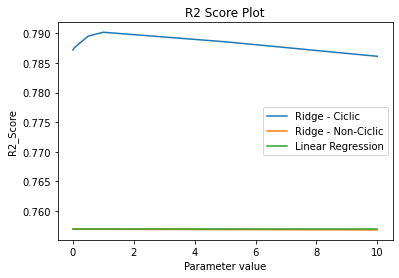

In [0]:
alphas = [0.001, 0.01, 0.05, 0.5, 1, 5, 10]


r2_values = []
r2_values2 = []
r2_values3 = []

for alpha in alphas:
    model_ridge_ciclic= Ridge(alpha=alpha)
    model_ridge_ciclic_pipe = Pipeline(steps=[("turn_cyclic", cyclic_spline_transformer), ("ridge_regression", model_ridge_ciclic)])
    model_ridge_ciclic_pipe.fit(X_train, y_train)
    y_pred = model_ridge_ciclic_pipe.predict(X_test)
    r2 = r2_score(y_test, y_pred)
    r2_values.append(r2)
    model_ridge= Ridge(alpha=alpha)
    model_ridge_pipe = Pipeline(steps=[('scaler', StandardScaler()), ("ridge_regression", model_ridge)])
    model_ridge_pipe.fit(X_train, y_train)
    y_pred2 = model_ridge_pipe.predict(X_test)
    r2_2 = r2_score(y_test, y_pred2)
    r2_values2.append(r2_2)
    model1= LinearRegression()
    model1_pipe = Pipeline(steps=[('scaler', StandardScaler()), ("linear_regression", model1)])
    model1_pipe.fit(X_train, y_train)
    y_pred3 = model1_pipe.predict(X_test)
    r2_3 = r2_score(y_test, y_pred3)
    r2_values3.append(r2_3)


plt.plot(alphas, r2_values, label = "Ridge - Ciclic")
plt.plot(alphas, r2_values2, label="Ridge - Non-Ciclic")
plt.plot(alphas, r2_values3, label="Linear Regression")

plt.xlabel("Parameter value")
plt.ylabel("R2_Score")
plt.title("R2 Score Plot")
plt.legend()
plt.show()

In [0]:
model2 = RandomForestRegressor(max_depth=4, random_state=0)
model2_pipe = Pipeline(steps=[("turn_cyclic", cyclic_spline_transformer), ("random_forest", model2)])
model2_pipe.fit(X_train, y_train)

Pipeline(steps=[('turn_cyclic',
 ColumnTransformer(remainder=StandardScaler(),
 transformers=[('cyclic_weekday',
 SplineTransformer(extrapolation='periodic',
 knots=array([[0. ],
 [2.33333333],
 [4.66666667],
 [7. ]]),
 n_knots=4),
 ['pickup_Dayofweek']),
 ('cyclic_hour',
 SplineTransformer(extrapolation='periodic',
 knots=array([[ 0.],
 [ 2.],
 [ 4.],
 [ 6.],
 [ 8.],
 [10.],
 [12.],
 [14.],
 [16.],
 [18.],
 [20.],
 [22.],
 [24.]]),
 n_knots=13),
 ['Hour']),
 ('categorical',
 OneHotEncoder(handle_unknown='ignore',
 sparse=False),
 ['Year', 'pickup_zipcode',
 'dropoff_zipcode'])])),
 ('random_forest',
 RandomForestRegressor(max_depth=4, random_state=0))]) In a Jupyter environment, please rerun this cell to show the HTML representation or trust the notebook. On GitHub, the HTML representation is unable to render, please try loading this page with nbviewer.org. Pipeline Pipeline(steps=[('turn_cyclic',
 ColumnTransformer(remainder=StandardScaler(),
 transformers=[('cyclic_weekday',
 SplineTransformer(extrapolation='periodic',
 knots=array([[0. ],
 [2.33333333],
 [4.66666667],
 [7. ]]),
 n_knots=4),
 ['pickup_Dayofweek']),
 ('cyclic_hour',
 SplineTransformer(extrapolation='periodic',
 knots=array([[ 0.],
 [ 2.],
 [ 4.],
 [ 6.],
 [ 8.],
 [10.],
 [12.],
 [14.],
 [16.],
 [18.],
 [20.],
 [22.],
 [24.]]),
 n_knots=13),
 ['Hour']),
 ('categorical',
 OneHotEncoder(handle_unknown='ignore',
 sparse=False),
 ['Year', 'pickup_zipcode',
 'dropoff_zipcode'])])),
 ('random_forest',
 RandomForestRegressor(max_depth=4, random_state=0))]) turn_cyclic: ColumnTransformer ColumnTransformer(remainder=StandardScaler(),
 transformers=[('cyclic_weekday',
 SplineTransformer(extrapolation='periodic',
 knots=array([[0. ],
 [2.33333333],
 [4.66666667],
 [7. ]]),
 n_knots=4),
 ['pickup_Dayofweek']),
 ('cyclic_hour',
 SplineTransformer(extrapolation='periodic',
 knots=array([[ 0.],
 [ 2.],
 [ 4.],
 [ 6.],
 [ 8.],
 [10.],
 [12.],
 [14.],
 [16.],
 [18.],
 [20.],
 [22.],
 [24.]]),
 n_knots=13),
 ['Hour']),
 ('categorical',
 OneHotEncoder(handle_unknown='ignore',
 sparse=False),
 ['Year', 'pickup_zipcode',
 'dropoff_zipcode'])]) cyclic_weekday ['pickup_Dayofweek'] SplineTransformer SplineTransformer(extrapolation='periodic',
 knots=array([[0. ],
 [2.33333333],
 [4.66666667],
 [7. ]]),
 n_knots=4) cyclic_hour ['Hour'] SplineTransformer SplineTransformer(extrapolation='periodic',
 knots=array([[ 0.],
 [ 2.],
 [ 4.],
 [ 6.],
 [ 8.],
 [10.],
 [12.],
 [14.],
 [16.],
 [18.],
 [20.],
 [22.],
 [24.]]),
 n_knots=13) categorical ['Year', 'pickup_zipcode', 'dropoff_zipcode'] OneHotEncoder OneHotEncoder(handle_unknown='ignore', sparse=False) remainder ['distance', 'passenger_count'] StandardScaler StandardScaler() RandomForestRegressor RandomForestRegressor(max_depth=4, random_state=0)

In [0]:
model3 = RandomForestRegressor(bootstrap= True, max_depth = 30 , max_features=3 , min_samples_leaf=2 , min_samples_split=10 , n_estimators=200 , random_state=0)
model3_pipe = Pipeline(steps=[('encoder', encoder_transformer), ("random_forest", model3)])

In [0]:
model2_pipe.score(X_train, y_train)

Out[94]: 0.7566233723380743

In [0]:
model2_pipe.score(X_test, y_test)

Out[95]: 0.7472688511456423

In [0]:
model2_pipe.named_steps["random_forest"].feature_importances_
#como poderia extrair da splines?

Out[96]: array([4.23124817e-06, 0.00000000e+00, 6.88356353e-05, 0.00000000e+00,
       4.10824363e-05, 1.40615062e-04, 1.88524415e-08, 0.00000000e+00,
       4.99022685e-05, 0.00000000e+00, 0.00000000e+00, 5.65869665e-05,
       0.00000000e+00, 9.10053640e-06, 0.00000000e+00, 6.50779629e-05,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.78591051e-03,
       0.00000000e+00, 0.00000000e+00, 5.16275231e-05, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 1.48182030e-04, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       1.26784504e-03, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 8.52887928e-05, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+0

In [0]:
# param_grid = {
#     'max_depth': [5, 10, 30, 40, 50],
#     'max_features': [2, 3],
#     'min_samples_leaf': [2, 3, 4, 5],
#     'min_samples_split': [8, 10, 12],
#     'n_estimators': [100, 200, 300, 400]}

# param_grid = {
#     'random_forest__max_depth': [5, 10, 30, 40, 50],
#     'random_forest__max_features': [2, 3],
#     'random_forest__min_samples_leaf': [2, 3, 4, 5],
#     'random_forest__min_samples_split': [8, 10, 12],
#     'random_forest__n_estimators': [100, 200, 300, 400]}
# #PRECISA DE DOUBLE UNDERSCORE ENTRE O ESTIMADOR E O PARAMETRO

# model_forest= RandomForestRegressor()
# model_forest_pipe = Pipeline(steps=[("turn_cyclic", cyclic_spline_transformer), ("random_forest", model_forest)])
# grid_search = GridSearchCV(model_forest_pipe, param_grid=param_grid, cv=tss)

# grid_search.fit(X_train, y_train)

In [0]:
#grid_search.best_params_

In [0]:
# best_rforest = RandomForestRegressor(bootstrap= True, max_depth = 30 , max_features=3 , min_samples_leaf=2 , min_samples_split=10 , n_estimators=200 , random_state=0)
# best_rforest.fit(X_train, y_train)
# r2_score_best = best_rforest.score(X_test, y_test)
# mae = mean_absolute_error(y_test, best_rforest.predict(X_test))
# print("The mean absolute error (MAE) on test set: {:.4f}".format(mae))
# print("The R2 score on test set: {:.4f}".format(r2_score_best))

In [0]:
def evaluate(model, X, y, cv):
    cv_results = cross_validate(
        model,
        X,
        y,
        cv=cv,
        scoring=["neg_mean_absolute_error", "neg_root_mean_squared_error", "r2"],
    )
    mae = -cv_results["test_neg_mean_absolute_error"]
    rmse = -cv_results["test_neg_root_mean_squared_error"]
    r2 = cv_results["test_r2"]
    
    print(
        f"Mean Absolute Error:     {mae.mean():.3f} +/- {mae.std():.3f}\n"
        f"Root Mean Squared Error: {rmse.mean():.3f} +/- {rmse.std():.3f}\n"
        f"R2 Score: {r2.mean():.3f} +/- {r2.std():.3f}"
    )
    return cv_results




In [0]:
evaluate(model_ridge_ciclic_pipe, X_train, y_train, cv=tss)

Mean Absolute Error:     2.639 +/- 0.316
Root Mean Squared Error: 5.095 +/- 0.804
R2 Score: 0.702 +/- 0.078
Out[101]: {'fit_time': array([0.05014539, 0.15217519, 0.17583847, 0.21979618, 0.27220774]),
 'score_time': array([0.05339003, 0.07055259, 0.04424047, 0.06112719, 0.0611639 ]),
 'test_neg_mean_absolute_error': array([-2.7427628 , -2.34669178, -2.1961851 , -2.89315727, -3.01633361]),
 'test_neg_root_mean_squared_error': array([-5.72585727, -4.43632828, -3.88746072, -5.41341795, -6.01399016]),
 'test_r2': array([0.55349443, 0.72934283, 0.78640588, 0.72334652, 0.71699755])}

In [0]:
evaluate(model_ridge_pipe, X_train, y_train, cv=tss)

Mean Absolute Error:     2.756 +/- 0.249
Root Mean Squared Error: 5.512 +/- 0.816
R2 Score: 0.648 +/- 0.104
Out[102]: {'fit_time': array([0.01158762, 0.01945901, 0.02963114, 0.03297281, 0.04277039]),
 'score_time': array([0.00504231, 0.01294661, 0.01001906, 0.00667357, 0.01013231]),
 'test_neg_mean_absolute_error': array([-2.84216362, -2.55903047, -2.39926571, -2.87161765, -3.10599968]),
 'test_neg_root_mean_squared_error': array([-6.39674506, -4.7038462 , -4.42096552, -5.71330163, -6.32646581]),
 'test_r2': array([0.44273222, 0.69571649, 0.72375685, 0.69184634, 0.68682499])}

In [0]:
evaluate(model1_pipe, X_train, y_train, cv=tss)

Mean Absolute Error:     2.754 +/- 0.249
Root Mean Squared Error: 5.510 +/- 0.816
R2 Score: 0.648 +/- 0.103
Out[103]: {'fit_time': array([0.01189065, 0.0211587 , 0.03946185, 0.03716111, 0.04065323]),
 'score_time': array([0.00628638, 0.0067389 , 0.00680327, 0.00664949, 0.01264143]),
 'test_neg_mean_absolute_error': array([-2.83838741, -2.5570335 , -2.39784049, -2.87030128, -3.10501737]),
 'test_neg_root_mean_squared_error': array([-6.39501521, -4.70133764, -4.4191016 , -5.71134006, -6.32492725]),
 'test_r2': array([0.44303358, 0.69604095, 0.72398974, 0.69205791, 0.68697729])}

In [0]:
evaluate(model2_pipe, X_train, y_train, cv=tss)

Mean Absolute Error:     2.447 +/- 0.377
Root Mean Squared Error: 5.163 +/- 0.942
R2 Score: 0.699 +/- 0.061
Out[104]: {'fit_time': array([0.90875697, 2.1283617 , 3.51881051, 4.82382584, 6.39420128]),
 'score_time': array([0.03414774, 0.03051043, 0.0299499 , 0.02988863, 0.03307486]),
 'test_neg_mean_absolute_error': array([-2.24122595, -2.03483942, -2.15794131, -2.86705375, -2.9335728 ]),
 'test_neg_root_mean_squared_error': array([-5.38506534, -4.27445432, -3.94863176, -5.68095509, -6.52593496]),
 'test_r2': array([0.60506302, 0.7487341 , 0.77963099, 0.69532576, 0.66676527])}

In [0]:
evaluate(model3_pipe, X_train, y_train, cv=tss)

Mean Absolute Error:     4.973 +/- 0.531
Root Mean Squared Error: 8.506 +/- 1.287
R2 Score: 0.189 +/- 0.045
Out[105]: {'fit_time': array([0.30150461, 0.46627092, 0.64031315, 0.84860516, 1.08439279]),
 'score_time': array([0.04926348, 0.05107713, 0.0546937 , 0.05334687, 0.05912352]),
 'test_neg_mean_absolute_error': array([-4.47475199, -4.52527746, -4.67154874, -5.38161035, -5.81227738]),
 'test_neg_root_mean_squared_error': array([ -7.68054995,  -7.36817283,  -7.43512271,  -9.49628644,
        -10.55150793]),
 'test_r2': array([0.19660248, 0.25339345, 0.21867173, 0.14866472, 0.12884822])}

In [0]:
# import sklearn
# sorted(sklearn.metrics.SCORERS.keys())

In [0]:
# plt.figure()
# plt.plot(pred1, "gd", label="LinearRegression")
# plt.plot(pred2, "b^", label="RandomForestRegressor")
# plt.plot(pred3, "r*", ms=10, label="VotingRegressor")
# plt.tick_params(axis="x", which="both", bottom=False, top=False, labelbottom=False)
# plt.ylabel("predicted")
# plt.xlabel("training samples")
# plt.legend(loc="best")
# plt.title("Regressor predictions and their average")

# plt.show()

In [0]:
from sklearn.model_selection import validation_curve

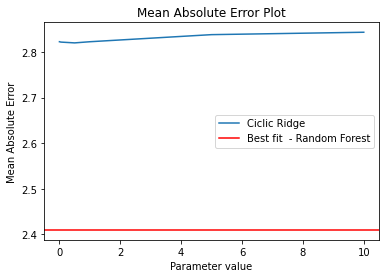

In [0]:
alphas = [0.001, 0.01, 0.05, 0.5, 1, 5, 10]
#max_depth = [5,10,20,25, 30,35,40]


mae_values = []
#r2_values2 = [] 
for alpha in alphas:   
    model_ridge_ciclic= Ridge(alpha=alpha)
    model_ridge_ciclic_pipe = Pipeline(steps=[("turn_cyclic", cyclic_spline_transformer), ("ridge_regression", model_ridge_ciclic)])
    model_ridge_ciclic_pipe.fit(X_train, y_train)
    y_pred = model_ridge_ciclic_pipe.predict(X_test)
    mae = mean_absolute_error(y_test, y_pred)
    mae_values.append(mae)
  
#plt.plot(alphas, mae_values, label="Lasso")
plt.plot(alphas, mae_values, label = "Ciclic Ridge")
plt.axhline(y=2.41, color='r', linestyle='-', label = "Best fit  - Random Forest")
plt.xlabel("Parameter value")
plt.ylabel("Mean Absolute Error")
plt.title("Mean Absolute Error Plot")
#plt.ylim(2,7)
plt.legend()
plt.show()

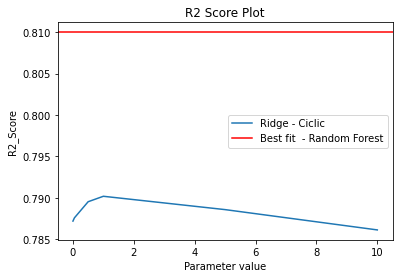

In [0]:
alphas = [0.001, 0.01, 0.05, 0.5, 1, 5, 10]
#max_depth = [5,10,20,25, 30,35,40]


r2_values = []
#r2_values2 = []


for alpha in alphas:
    model_ridge_ciclic= Ridge(alpha=alpha)
    model_ridge_ciclic_pipe = Pipeline(steps=[("turn_cyclic", cyclic_spline_transformer), ("ridge_regression", model_ridge_ciclic)])
    model_ridge_ciclic_pipe.fit(X_train, y_train)
    y_pred = model_ridge_ciclic_pipe.predict(X_test)
    r2 = r2_score(y_test, y_pred)
    r2_values.append(r2)

    

plt.plot(alphas, r2_values, label = "Ridge - Ciclic")
#plt.plot(max_depth, r2_values2, label = "Best fit - Random Forest")
plt.axhline(y=0.81, color='r', linestyle='-', label = "Best fit  - Random Forest")
plt.xlabel("Parameter value")
plt.ylabel("R2_Score")
plt.title("R2 Score Plot")
plt.legend()
plt.show()

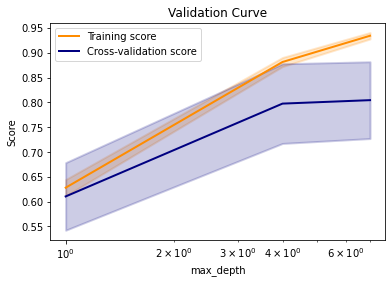

In [0]:
param_range = np.arange(1, 10, 3)
train_scores, test_scores = validation_curve(RandomForestRegressor(), X_test, y_test,
                                           param_name="max_depth",
                                           param_range=param_range,scoring="r2", cv = tss, n_jobs=2)
 
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

plt.title("Validation Curve")
plt.xlabel("max_depth")
plt.ylabel("Score")
#plt.ylim(0.0, 100)
lw = 2
plt.semilogx(
    param_range, train_scores_mean, label="Training score", color="darkorange", lw=lw
)
plt.fill_between(
    param_range,
    train_scores_mean - train_scores_std,
    train_scores_mean + train_scores_std,
    alpha=0.2,
    color="darkorange",
    lw=lw,
)
plt.semilogx(
    param_range, test_scores_mean, label="Cross-validation score", color="navy", lw=lw
)
plt.fill_between(
    param_range,
    test_scores_mean - test_scores_std,
    test_scores_mean + test_scores_std,
    alpha=0.2,
    color="navy",
    lw=lw,
)
plt.legend(loc="best")
plt.show()

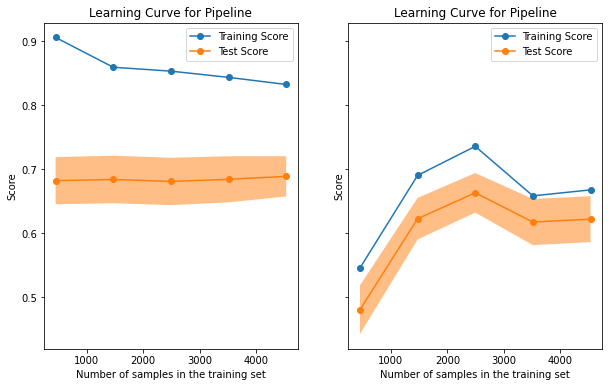

In [0]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 6), sharey=True)

common_params = {
    "X": X,
    "y": y,
    "train_sizes": np.linspace(0.1, 1.0, 5),
    "cv": tss,
    "score_type": "both",
    "n_jobs": 4,
    "line_kw": {"marker": "o"},
    "std_display_style": "fill_between",
    "score_name": "Score",
}

for ax_idx, estimator in enumerate([model2_pipe, model_ridge_ciclic_pipe]):
    LearningCurveDisplay.from_estimator(estimator, **common_params, ax=ax[ax_idx])
    handles, label = ax[ax_idx].get_legend_handles_labels()
    ax[ax_idx].legend(handles[:2], ["Training Score", "Test Score"])
    ax[ax_idx].set_title(f"Learning Curve for {estimator.__class__.__name__}")

In [0]:
from sklearn.metrics import PredictionErrorDisplay 


In [0]:
# model2_pipe.named_steps['turn_cyclic'].transformers_[1][1]\
#    .named_steps['categorical'].get_feature_names(categorical_features)